In [1]:
# Support for maths
import numpy as np
# Plotting tools
from matplotlib import pyplot as plt
# we use the following for plotting figures in jupyter
%matplotlib inline
# Importing data library
import pandas as pd

import warnings
warnings.filterwarnings('ignore')

# GPy: Gaussian processess libary
import GPy
from IPython.display import display

import datetime

plt.rcParams.update({'font.size': 32})

In [2]:
# Pembacaan File Data Polusi Udara ISPU Excel
DKI3 = pd.read_excel("./Data/Normalization/DATA ISPU - Normalization.xlsx", sheet_name="DKI3")

### PM10

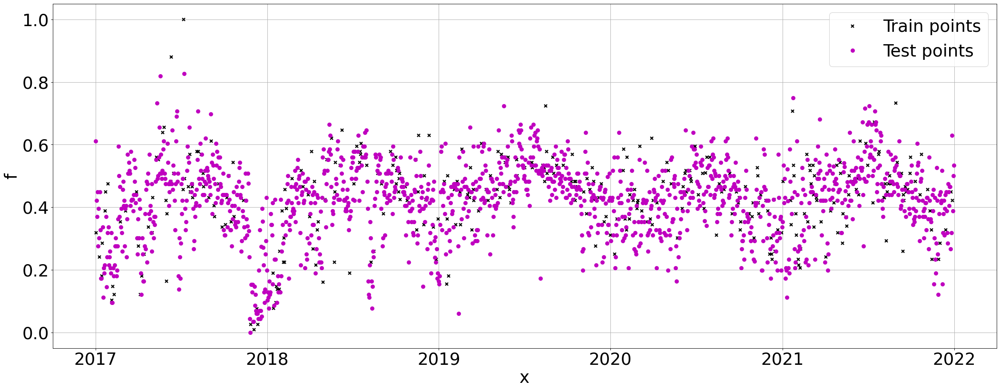

In [3]:
# X = np.array(DKI1.Tanggal.astype('int64') // 10**9)
X = np.array(DKI3.index).reshape(-1,1)
# X = np.array(DKI1['Tanggal']).reshape(-1,1)
Y = np.array(DKI3['PM10']).reshape(-1,1)

from sklearn.model_selection import train_test_split

train_X, test_X, train_Y, test_Y = train_test_split(X, Y, test_size=0.8, random_state=42, shuffle=True)

# Plot observations
plt.figure(figsize=(32, 12), dpi=80)
plt.plot(np.array(DKI3['Tanggal'].loc[train_X.flatten()]).reshape(-1,1), train_Y, "kx", mew=2, label='Train points')
plt.plot(np.array(DKI3['Tanggal'].loc[test_X.flatten()]).reshape(-1,1), test_Y, "mo", mew=2, label='Test points')

# Annotate plot
plt.xlabel("x"), plt.ylabel("f")
plt.grid()
plt.legend()

In [4]:
k1 = GPy.kern.StdPeriodic(1, period=2)
m1 = GPy.models.GPRegression(train_X, train_Y, k1)
m1.optimize(messages=1, ipython_notebook=True)

In [5]:
m1

GP_regression.,value,constraints,priors
std_periodic.variance,0.14252291916895074,+ve,
std_periodic.period,1.9944734546881249,+ve,
std_periodic.lengthscale,1.0345798855345711,+ve,
Gaussian_noise.variance,0.013503080880585116,+ve,


In [6]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m1.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [7]:
from sklearn import metrics

def print_evaluate(true, predicted):  
    mae = metrics.mean_absolute_error(true, predicted)
    mse = metrics.mean_squared_error(true, predicted)
    rmse = np.sqrt(metrics.mean_squared_error(true, predicted))
    r2_square = metrics.r2_score(true, predicted)
    mape = metrics.mean_absolute_percentage_error(true,predicted)
    print('MAE:', mae)
    print('MSE:', mse)
    print('RMSE:', rmse)
    print('MAPE:', mape)

    print('R2 Square', r2_square)
    print('__________________________________')

In [8]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y.flatten(), m1.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.08522657640956292
MSE: 0.012349422218010643
RMSE: 0.11112795425999096
MAPE: 1151359366828.535
R2 Square 0.20044435208482947
__________________________________


In [9]:
metrics.r2_score(train_Y.flatten(), m1.predict(train_X)[0].flatten())

0.20632491540271503

In [10]:
# Pengambilan Data Forecasting
PM10_Index = np.arange(1826, 1857, dtype=np.int64)
PM10_Index = np.reshape(PM10_Index, (-1, 1))
PM10_Forecasting = m1.predict(PM10_Index)[0].flatten()

In [11]:
# Denormalisasi
max = 118.0
min = 2.0
PM10_Forecasting_denorm = (PM10_Forecasting.flatten() * (max - min) + min)
# PM10_Forecasting_denorm

### SO2

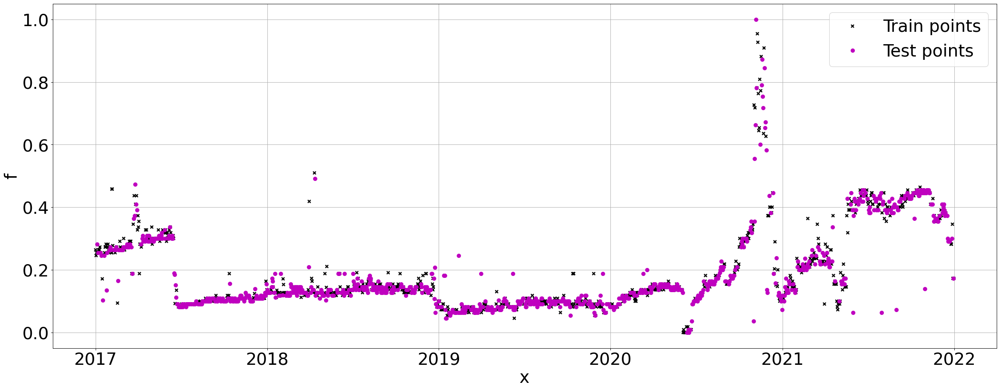

In [12]:
# X = np.array(DKI1.Tanggal.astype('int64') // 10**9)
X = np.array(DKI3.index).reshape(-1,1)
# X = np.array(DKI1['Tanggal']).reshape(-1,1)
Y = np.array(DKI3['SO2']).reshape(-1,1)

from sklearn.model_selection import train_test_split

train_X, test_X, train_Y, test_Y = train_test_split(X, Y, test_size=0.5, random_state=42, shuffle=True)

# Plot observations
plt.figure(figsize=(32, 12), dpi=80)
plt.plot(np.array(DKI3['Tanggal'].loc[train_X.flatten()]).reshape(-1,1), train_Y, "kx", mew=2, label='Train points')
plt.plot(np.array(DKI3['Tanggal'].loc[test_X.flatten()]).reshape(-1,1), test_Y, "mo", mew=2, label='Test points')

# Annotate plot
plt.xlabel("x"), plt.ylabel("f")
plt.grid()
plt.legend()

In [13]:
k2 = GPy.kern.StdPeriodic(1, period=2)
m2 = GPy.models.GPRegression(train_X, train_Y, k2)
m2.optimize(messages=1, ipython_notebook=True)

In [14]:
m2

GP_regression.,value,constraints,priors
std_periodic.variance,0.9925239306033241,+ve,
std_periodic.period,1.9993728157932478,+ve,
std_periodic.lengthscale,1.0045406762655644,+ve,
Gaussian_noise.variance,0.009360474307055831,+ve,


In [15]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m2.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [16]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y.flatten(), m2.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.05675094560463065
MSE: 0.008111781953929196
RMSE: 0.09006543151470045
MAPE: 1785357981334.7778
R2 Square 0.516921495412777
__________________________________


In [17]:
metrics.r2_score(train_Y.flatten(), m2.predict(train_X)[0].flatten())

0.4819475257888166

In [18]:
# Pengambilan Data Forecasting
SO2_Index = np.arange(1826, 1857, dtype=np.int64)
SO2_Index = np.reshape(SO2_Index, (-1, 1))
SO2_Forecasting = m2.predict(SO2_Index)[0].flatten()

In [19]:
# Denormalisasi
max = 112.0
min = 2.0
SO2_Forecasting_denorm = (SO2_Forecasting.flatten() * (max - min) + min)
# SO2_Forecasting_denorm

### CO

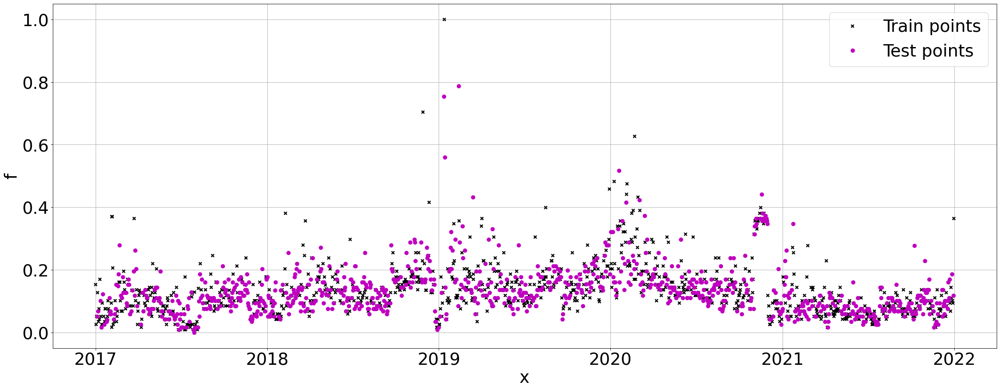

In [20]:
# X = np.array(DKI1.Tanggal.astype('int64') // 10**9)
X = np.array(DKI3.index).reshape(-1,1)
# X = np.array(DKI1['Tanggal']).reshape(-1,1)
Y = np.array(DKI3['CO']).reshape(-1,1)

from sklearn.model_selection import train_test_split

train_X, test_X, train_Y, test_Y = train_test_split(X, Y, test_size=0.5, random_state=42, shuffle=True)

# Plot observations
plt.figure(figsize=(32, 12), dpi=80)
plt.plot(np.array(DKI3['Tanggal'].loc[train_X.flatten()]).reshape(-1,1), train_Y, "kx", mew=2, label='Train points')
plt.plot(np.array(DKI3['Tanggal'].loc[test_X.flatten()]).reshape(-1,1), test_Y, "mo", mew=2, label='Test points')

# Annotate plot
plt.xlabel("x"), plt.ylabel("f")
plt.grid()
plt.legend()

In [21]:
k3 = GPy.kern.StdPeriodic(1, period=2)
m3 = GPy.models.GPRegression(train_X, train_Y, k3)
m3.optimize(messages=1, ipython_notebook=True)

In [22]:
m3

GP_regression.,value,constraints,priors
std_periodic.variance,1.3065451694628287,+ve,
std_periodic.period,2.0013215633956563,+ve,
std_periodic.lengthscale,0.8200289375912359,+ve,
Gaussian_noise.variance,0.005993804408611121,+ve,


In [23]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m3.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [24]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y.flatten(), m3.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.04847628340690154
MSE: 0.005037587882569254
RMSE: 0.07097596693648671
MAPE: 429749392217.35266
R2 Square 0.18143729224514538
__________________________________


In [25]:
metrics.r2_score(train_Y.flatten(), m3.predict(train_X)[0].flatten())

0.2301593872953659

In [26]:
# Pengambilan Data Forecasting
CO_Index = np.arange(1826, 1857, dtype=np.int64)
CO_Index = np.reshape(CO_Index, (-1, 1))
CO_Forecasting = m2.predict(CO_Index)[0].flatten()

In [27]:
# Denormalisasi
max = 119.0
min = 1.0
CO_Forecasting_denorm = (CO_Forecasting.flatten() * (max - min) + min)
# CO_Forecasting_denorm

### O3

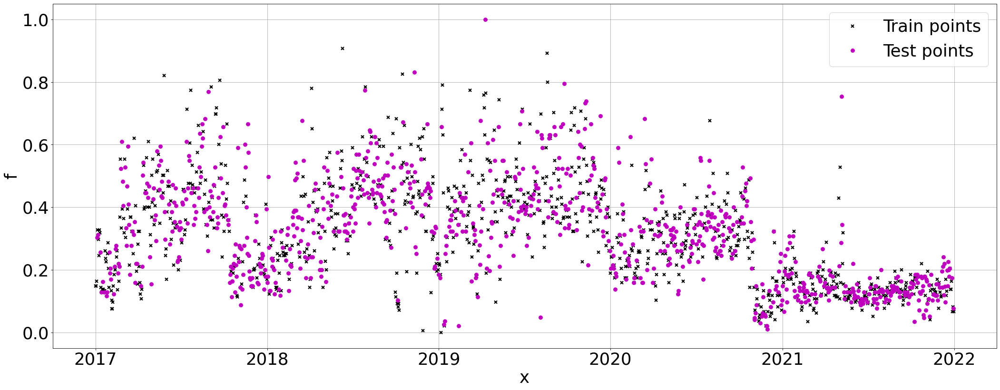

In [28]:
# X = np.array(DKI1.Tanggal.astype('int64') // 10**9)
X = np.array(DKI3.index).reshape(-1,1)
# X = np.array(DKI1['Tanggal']).reshape(-1,1)
Y = np.array(DKI3['O3']).reshape(-1,1)

from sklearn.model_selection import train_test_split

train_X, test_X, train_Y, test_Y = train_test_split(X, Y, test_size=0.5, random_state=42, shuffle=True)

# Plot observations
plt.figure(figsize=(32, 12), dpi=80)
plt.plot(np.array(DKI3['Tanggal'].loc[train_X.flatten()]).reshape(-1,1), train_Y, "kx", mew=2, label='Train points')
plt.plot(np.array(DKI3['Tanggal'].loc[test_X.flatten()]).reshape(-1,1), test_Y, "mo", mew=2, label='Test points')

# Annotate plot
plt.xlabel("x"), plt.ylabel("f")
plt.grid()
plt.legend()

In [29]:
k4 = GPy.kern.StdPeriodic(1, period=2)
m4 = GPy.models.GPRegression(train_X, train_Y, k4)
m4.optimize(messages=1, ipython_notebook=True)

In [30]:
m4

GP_regression.,value,constraints,priors
std_periodic.variance,0.3981024289518159,+ve,
std_periodic.period,2.000000231655038,+ve,
std_periodic.lengthscale,2.8165990702781722e-05,+ve,
Gaussian_noise.variance,0.014406100812828976,+ve,


In [31]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m4.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [32]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y.flatten(), m4.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.08687407957368065
MSE: 0.013902692598593686
RMSE: 0.11790967983415818
MAPE: 0.4202284558238054
R2 Square 0.4661666266587772
__________________________________


In [33]:
metrics.r2_score(train_Y.flatten(), m4.predict(train_X)[0].flatten())

0.5190709070532837

In [34]:
# Pengambilan Data Forecasting
O3_Index = np.arange(1826, 1857, dtype=np.int64)
O3_Index = np.reshape(O3_Index, (-1, 1))
O3_Forecasting = m2.predict(O3_Index)[0].flatten()

In [35]:
# Denormalisasi
max = 199.0
min = 4.0
O3_Forecasting_denorm = (O3_Forecasting.flatten() * (max - min) + min)
# O3_Forecasting_denorm

### NO2

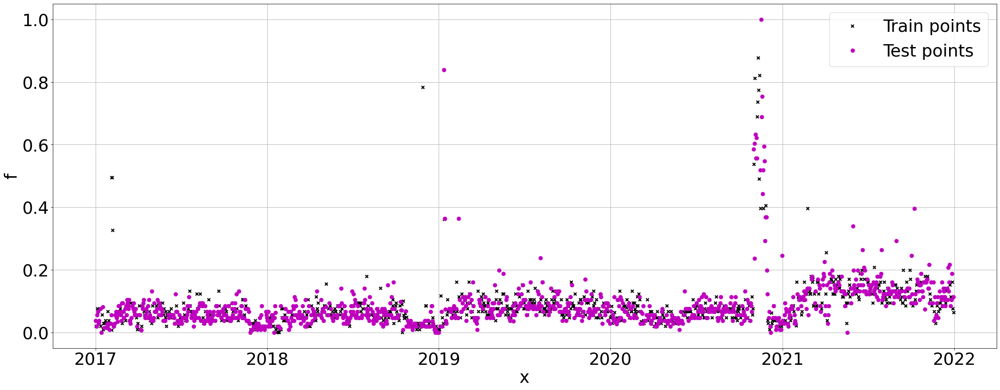

In [36]:
# X = np.array(DKI1.Tanggal.astype('int64') // 10**9)
X = np.array(DKI3.index).reshape(-1,1)
# X = np.array(DKI1['Tanggal']).reshape(-1,1)
Y = np.array(DKI3['NO2']).reshape(-1,1)

from sklearn.model_selection import train_test_split

train_X, test_X, train_Y, test_Y = train_test_split(X, Y, test_size=0.6, random_state=42, shuffle=True)

# Plot observations
plt.figure(figsize=(32, 12), dpi=80)
plt.plot(np.array(DKI3['Tanggal'].loc[train_X.flatten()]).reshape(-1,1), train_Y, "kx", mew=2, label='Train points')
plt.plot(np.array(DKI3['Tanggal'].loc[test_X.flatten()]).reshape(-1,1), test_Y, "mo", mew=2, label='Test points')

# Annotate plot
plt.xlabel("x"), plt.ylabel("f")
plt.grid()
plt.legend()

In [37]:
k5 = GPy.kern.StdPeriodic(1, period=2)
m5 = GPy.models.GPRegression(train_X, train_Y, k5)
m5.optimize(messages=1, ipython_notebook=True)

In [38]:
m5

GP_regression.,value,constraints,priors
std_periodic.variance,0.990611010375083,+ve,
std_periodic.period,2.000204087296859,+ve,
std_periodic.lengthscale,1.0054806094913038,+ve,
Gaussian_noise.variance,0.007505901043183797,+ve,


In [39]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m5.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [40]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y.flatten(), m5.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.03767573914011657
MSE: 0.0058523984100241795
RMSE: 0.07650096999400843
MAPE: 2576002592656.2744
R2 Square 0.13658471939732597
__________________________________


In [41]:
metrics.r2_score(train_Y.flatten(), m5.predict(train_X)[0].flatten())

0.08330597141937379

In [42]:
# Pengambilan Data Forecasting
NO2_Index = np.arange(1826, 1857, dtype=np.int64)
NO2_Index = np.reshape(NO2_Index, (-1, 1))
NO2_Forecasting = m2.predict(NO2_Index)[0].flatten()

In [43]:
# Denormalisasi
max = 107.0
min = 1.0
NO2_Forecasting_denorm = (NO2_Forecasting.flatten() * (max - min) + min)
# NO2_Forecasting_denorm

### Saving File

In [44]:
start = datetime.datetime.strptime("2022-01-01", "%Y-%m-%d")
date_generated = pd.date_range(start, periods=31)
# print(date_generated.strftime("%Y-%m-%d"))
date_generated

DatetimeIndex(['2022-01-01', '2022-01-02', '2022-01-03', '2022-01-04',
               '2022-01-05', '2022-01-06', '2022-01-07', '2022-01-08',
               '2022-01-09', '2022-01-10', '2022-01-11', '2022-01-12',
               '2022-01-13', '2022-01-14', '2022-01-15', '2022-01-16',
               '2022-01-17', '2022-01-18', '2022-01-19', '2022-01-20',
               '2022-01-21', '2022-01-22', '2022-01-23', '2022-01-24',
               '2022-01-25', '2022-01-26', '2022-01-27', '2022-01-28',
               '2022-01-29', '2022-01-30', '2022-01-31'],
              dtype='datetime64[ns]', freq='D')

In [45]:
d = {"Tanggal":date_generated, "PM10":PM10_Forecasting_denorm, "SO2":SO2_Forecasting_denorm, "CO":CO_Forecasting_denorm, "O3":O3_Forecasting_denorm, "NO2":NO2_Forecasting_denorm}
DKI3_Forecasting = pd.DataFrame(d)
DKI3_Forecasting

,Tanggal,PM10,SO2,CO,O3,NO2
0,2022-01-01,43.358102,49.396266,51.843267,88.020653,46.672765
1,2022-01-02,42.050999,46.097955,48.305079,82.173647,43.494393
2,2022-01-03,43.328048,49.484278,51.937680,88.176675,46.757577
3,2022-01-04,42.089893,46.177110,48.389990,82.313967,43.570669
4,2022-01-05,43.308724,49.572060,52.031846,88.332288,46.842167
5,2022-01-06,42.140540,46.256079,48.474703,82.453959,43.646767
6,2022-01-07,43.300140,49.659609,52.125763,88.487489,46.926533
7,2022-01-08,42.202872,46.334863,48.559216,82.593620,43.722686
8,2022-01-09,43.302292,49.746925,52.219428,88.642275,47.010673
9,2022-01-10,42.276808,46.413458,48.643528,82.732949,43.798424


In [46]:
# Penyimpanan Data Forecasting
DKI3_Forecasting.to_excel('./Data/Forecasting/DKI3_Forecasting.xlsx', index=False)